In [1]:
#https://fairyonice.github.io/My-first-GAN-using-CelebA-data.html
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
#import tensorflow_datasets as tfds
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import pathlib
%load_ext tensorboard
import datetime, os
#file_writer = tf.summary.FileWriter('H:/comp3710/logs', sess.graph)
#!rm -rf ./logs/ 
print(tf.__version__)

2.1.0


In [2]:
import glob
#import imageio
import matplotlib.pyplot as plt
import numpy as np
import time

from IPython import display

In [3]:
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D,LeakyReLU
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense, Input
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import Sequence
from tensorflow.keras.callbacks import ReduceLROnPlateau
from PIL import Image

In [4]:
image_dir = 'C:/Users/s4597578/Downloads/img_align_celeba/image'

In [5]:
def data_gen(img_folder, batch_size):
    c = 0
    n = os.listdir(img_folder) #List of training images
    np.random.shuffle(n)
    
    while (True):
        img = np.zeros((batch_size, 256, 256, 3)).astype('float')
       
        for i in range(c, c+batch_size): #initially from 0 to 16, c = 0. 
            train_img = tf.keras.preprocessing.image.img_to_array(tf.keras.preprocessing.image.load_img(img_folder+'/'+n[i],color_mode='rgb', target_size=(256, 256)))/255
            img[i-c] = train_img #add to array - img[0], img[1], and so on.
             

        c+=batch_size
        if(c+batch_size>=len(os.listdir(img_folder))):
            c=0
            np.random.shuffle(n)
                  # print "randomizing again"
        return img


In [6]:
train_gen = data_gen(image_dir, batch_size = 16)

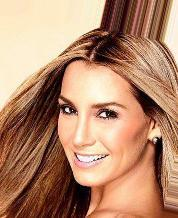

In [7]:
seg_data_dir = 'C:/Users/s4597578/Downloads/img_align_celeba/image/000001.jpg'
image = tf.keras.preprocessing.image.load_img(
    seg_data_dir, grayscale=False, color_mode="rgb", target_size=None)
image

In [8]:
i = tf.keras.preprocessing.image.img_to_array(tf.keras.preprocessing.image.load_img(seg_data_dir,color_mode='rgb', target_size=(256, 256)))/255

In [9]:
i.shape

(256, 256, 3)

In [10]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(16*16*3,  input_shape=(100,)))
    model.add(layers.Dense(65536,  input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((16, 16, 256)))
    #assert model.output_shape == (None, 28, 28, 256) # Note: None is the batch size

    model.add(layers.Conv2DTranspose(256, (3, 3), strides=(1, 1), padding='same'))
    assert model.output_shape == (None, 16, 16, 256)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same'))
    #assert model.output_shape == (None, 32, 32, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same'))
    #assert model.output_shape == (None, 64, 64,64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same'))
    #assert model.output_shape == (None, 128, 128, 32)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2DTranspose(16, (3, 3), strides=(2, 2), padding='same'))
    #assert model.output_shape == (None, 256, 256, 16)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Conv2D(3, (1, 1), activation='elu'))
    #assert model.output_shape == (None, 256, 256, 3)
    noise = Input(shape=(100,)) 
    image = model(noise) 
  
    return Model(noise, image) 

In [11]:
generator = make_generator_model()


(1, 100)


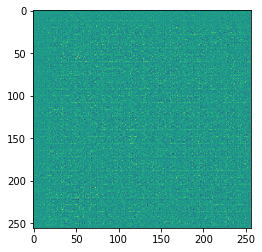

In [12]:
noise = tf.random.normal([1, 100])
print(noise.shape)
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0])

In [13]:
generated_image.shape

TensorShape([1, 256, 256, 3])

In [14]:
generated_image[0, :, :, 0].shape

TensorShape([256, 256])

In [15]:
generator.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
sequential (Sequential)      (None, 256, 256, 3)       51720931  
Total params: 51,720,931
Trainable params: 51,588,867
Non-trainable params: 132,064
_________________________________________________________________


In [16]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(16, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[256, 256, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(512, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Flatten())
    model.add(layers.Dense(1))
    model.add(Activation('sigmoid'))
    #model.add(Activaion('softmax'))
    image = Input(shape=[256, 256, 3]) 
    v = model(image) 
  
    return Model(image, v) 

In [17]:
discriminator = make_discriminator_model()

In [18]:
discriminator.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 1581729   
Total params: 1,581,729
Trainable params: 1,581,729
Non-trainable params: 0
_________________________________________________________________


In [19]:
discriminator.compile(loss='binary_crossentropy',optimizer=tf.keras.optimizers.Adam(0.0002,0.5),metrics=['accuracy'])

In [20]:
discriminator.trainable = False

In [21]:
generator = make_generator_model()

In [22]:

noise = Input((100,))
generated_image = generator(noise)


In [23]:
v= discriminator(generated_image)

In [24]:
combined_network = Model(noise, v) 
combined_network.compile(loss='binary_crossentropy', 
                         optimizer=tf.keras.optimizers.Adam(0.0002,0.5)) 

In [25]:
num_epochs=25000
batch_size=32
display_interval=5000
losses=[] 

In [26]:
#Defining the Adversarial ground truths 
valid = np.ones((batch_size, 1)) 
  
#Adding some noise  
valid += 0.05 * np.random.random(valid.shape) 
fake = np.zeros((batch_size, 1)) 
fake += 0.05 * np.random.random(fake.shape) 

In [27]:
def display_images(): 
        r, c = 1,4
        noise = np.random.normal(0, 1, (r * c,100)) 
        generated_images = generator.predict(noise) 
  
     
        imgs = generator.predict(noise)
        fig = plt.figure(figsize=(40,10))
        for i, img in enumerate(generated_images):
            ax = fig.add_subplot(1,4,i+1)
            ax.imshow(img)
        fig.suptitle("Generated images ",fontsize=30)

In [28]:
train_gen = data_gen(image_dir, batch_size = 16)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

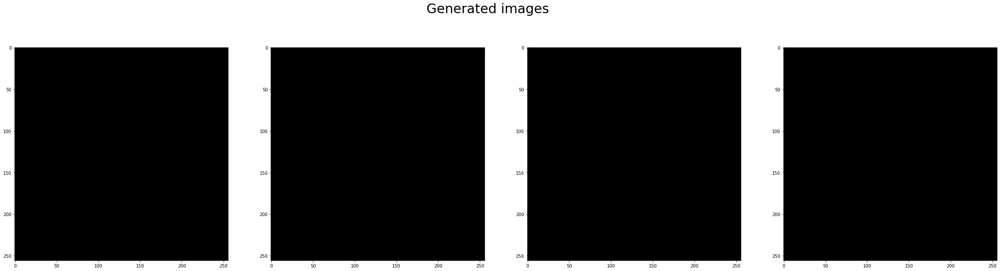

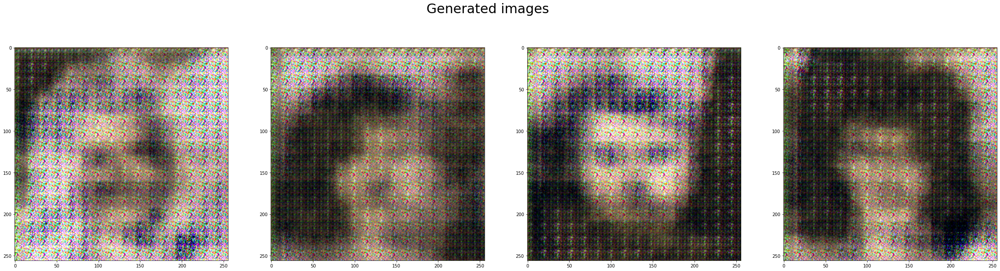

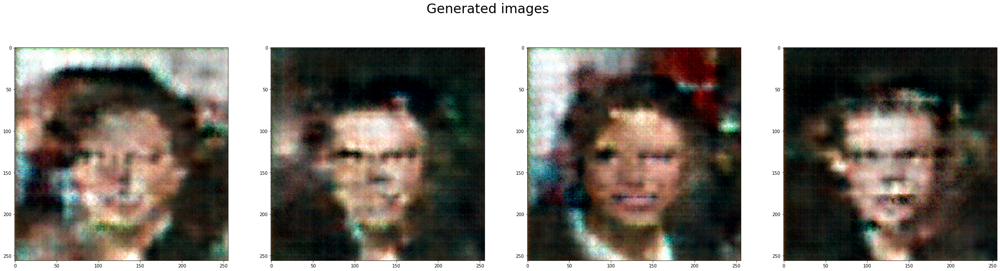

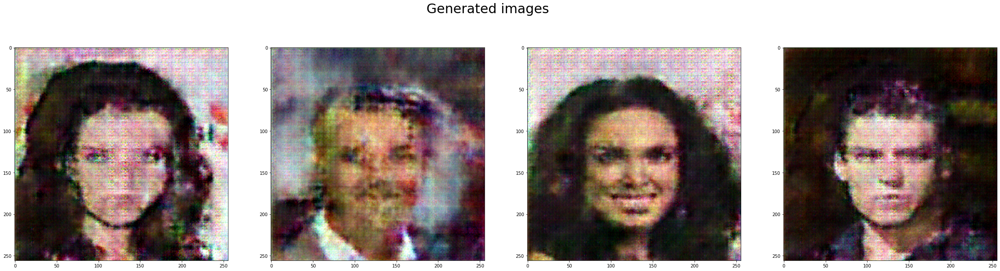

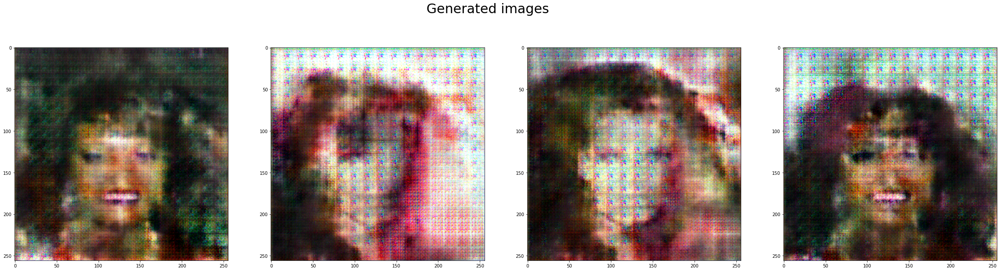

In [29]:
for epoch in range(num_epochs): 
              
            #Training the Discriminator 
              
            #Sampling a random images 
            index = np.random.randint(0, train_gen.shape[0], batch_size) 
            images = train_gen[index]
            #print(images.shape)
  
            #Sampling noise and generating a batch of new images 
            #tf.random.normal([1, 100]) np.random.normal(0, 1, (batch_size, latent_dimensions))
            noise = np.random.normal(0, 1, (batch_size, 100))
            generated_images = generator.predict(noise) 
              
  
            #Training the discriminator to detect more accurately 
            #whether a generated image is real or fake 
            discm_loss_real = discriminator.train_on_batch(images, valid) 
            discm_loss_fake = discriminator.train_on_batch(generated_images, fake) 
            discm_loss = 0.5 * np.add(discm_loss_real, discm_loss_fake) 
              
            #Training the Generator 
  
            #Training the generator to generate images 
            #which pass the authenticity test 
            genr_loss = combined_network.train_on_batch(noise, valid) 
              
            #Tracking the progress                 
            if epoch % display_interval == 0: 
                 display_images() 